In [18]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd

In [19]:
# Set global canvas size
plt.rcParams['figure.figsize'] = [30, 20]
np.set_printoptions(precision=3, suppress=True)

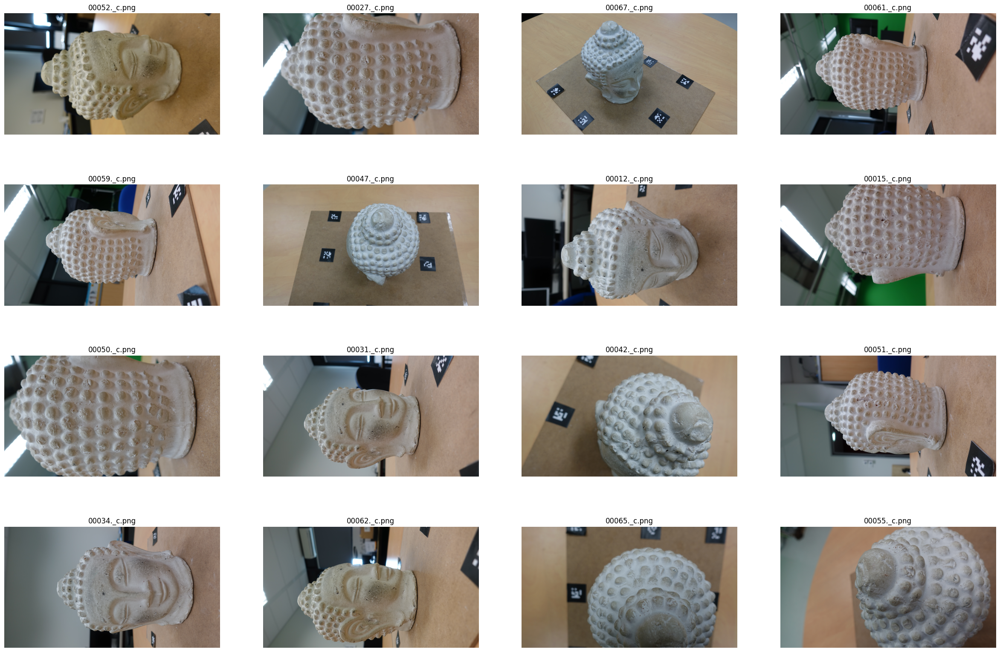

In [20]:
DATASET_DIR = "../dataset_buddha/buddha/"
EXT = ".png"
DATASET_NAME = "buddha"

images = []
paths = []

for filename in os.listdir(DATASET_DIR):
    if filename.endswith(EXT):
        img_path = os.path.join(DATASET_DIR, filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load image: {img_path}")
            continue
        images.append(img)
        paths.append(img_path)

df = pd.DataFrame({
    'dataset': [DATASET_NAME] * len(paths),
    'filename': paths,
    'image': images
})

fig, ax = plt.subplots(4, 4)
imgs_to_show, paths_shown = df.sample(16, random_state=42)[['image', 'filename']].to_numpy().T
imag_names = [os.path.basename(p) for p in paths_shown]

for i in range(4):
    for j in range(4):
        img = imgs_to_show[i * 4 + j]
        ax[i, j].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[i, j].set_title(imag_names[i * 4 + j])
        ax[i, j].axis('off')
plt.show()

In [21]:
annotated_images = {
    'orb': [],
}

In [22]:
orb = cv2.ORB_create(nfeatures=50000)

# Itera sobre cada imagem carregada
for i, (filename, img) in enumerate(df[['filename', 'image']].itertuples(index=False)):
    # Converte a imagem para escala de cinza
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2. Detecta os keypoints e calcula seus descritores
    keypoints, descriptors = orb.detectAndCompute(gray_img, None)
    
    # 3. Desenha os keypoints na imagem original (colorida)
    img_with_keypoints = cv2.drawKeypoints(
        img, 
        keypoints, 
        None, # output image
        color=(0, 255, 0),
        flags=0
    )

    print(f"Imagem: '{filename}' - Keypoints detectados: {len(keypoints)}")
    annotated_images['orb'].append(img_with_keypoints)

df['orb_annotated'] = annotated_images['orb']

Imagem: '../dataset_buddha/buddha/00062._c.png' - Keypoints detectados: 14070
Imagem: '../dataset_buddha/buddha/00025._c.png' - Keypoints detectados: 7361
Imagem: '../dataset_buddha/buddha/00007._c.png' - Keypoints detectados: 5755
Imagem: '../dataset_buddha/buddha/00053._c.png' - Keypoints detectados: 8440
Imagem: '../dataset_buddha/buddha/00067._c.png' - Keypoints detectados: 5181
Imagem: '../dataset_buddha/buddha/00015._c.png' - Keypoints detectados: 11571
Imagem: '../dataset_buddha/buddha/00037._c.png' - Keypoints detectados: 3141
Imagem: '../dataset_buddha/buddha/00048._c.png' - Keypoints detectados: 10328


Imagem: '../dataset_buddha/buddha/00043._c.png' - Keypoints detectados: 8103
Imagem: '../dataset_buddha/buddha/00061._c.png' - Keypoints detectados: 10563
Imagem: '../dataset_buddha/buddha/00039._c.png' - Keypoints detectados: 6800
Imagem: '../dataset_buddha/buddha/00017._c.png' - Keypoints detectados: 11076
Imagem: '../dataset_buddha/buddha/00031._c.png' - Keypoints detectados: 8977
Imagem: '../dataset_buddha/buddha/00040._c.png' - Keypoints detectados: 11906
Imagem: '../dataset_buddha/buddha/00045._c.png' - Keypoints detectados: 11577
Imagem: '../dataset_buddha/buddha/00019._c.png' - Keypoints detectados: 5271
Imagem: '../dataset_buddha/buddha/00027._c.png' - Keypoints detectados: 9000
Imagem: '../dataset_buddha/buddha/00030._c.png' - Keypoints detectados: 7670
Imagem: '../dataset_buddha/buddha/00020._c.png' - Keypoints detectados: 3014
Imagem: '../dataset_buddha/buddha/00044._c.png' - Keypoints detectados: 10857
Imagem: '../dataset_buddha/buddha/00005._c.png' - Keypoints detectados:

In [24]:
annotated_images['sift'] = []
sift = cv2.SIFT_create(nfeatures=50000)

# Itera sobre cada imagem carregada
for i, (filename, img) in enumerate(df[['filename', 'image']].itertuples(index=False)):
    # Converte a imagem para escala de cinza
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2. Detecta os keypoints e calcula seus descritores
    keypoints, descriptors = sift.detectAndCompute(gray_img, None)
    
    # 3. Desenha os keypoints na imagem original (colorida)
    img_with_keypoints = cv2.drawKeypoints(
        img, 
        keypoints, 
        None, # output image
        color=(0, 255, 0),
        flags=0
    )

    print(f"Imagem: '{filename}' - Keypoints detectados: {len(keypoints)}")
    annotated_images['sift'].append(img_with_keypoints)

df['sift_annotated'] = annotated_images['sift']

Imagem: '../dataset_buddha/buddha/00062._c.png' - Keypoints detectados: 3603
Imagem: '../dataset_buddha/buddha/00025._c.png' - Keypoints detectados: 1942
Imagem: '../dataset_buddha/buddha/00007._c.png' - Keypoints detectados: 1806
Imagem: '../dataset_buddha/buddha/00053._c.png' - Keypoints detectados: 2343
Imagem: '../dataset_buddha/buddha/00067._c.png' - Keypoints detectados: 1434
Imagem: '../dataset_buddha/buddha/00015._c.png' - Keypoints detectados: 2808
Imagem: '../dataset_buddha/buddha/00037._c.png' - Keypoints detectados: 1138
Imagem: '../dataset_buddha/buddha/00048._c.png' - Keypoints detectados: 2830
Imagem: '../dataset_buddha/buddha/00043._c.png' - Keypoints detectados: 2418
Imagem: '../dataset_buddha/buddha/00061._c.png' - Keypoints detectados: 2655
Imagem: '../dataset_buddha/buddha/00039._c.png' - Keypoints detectados: 1996
Imagem: '../dataset_buddha/buddha/00017._c.png' - Keypoints detectados: 2139
Imagem: '../dataset_buddha/buddha/00031._c.png' - Keypoints detectados: 2809

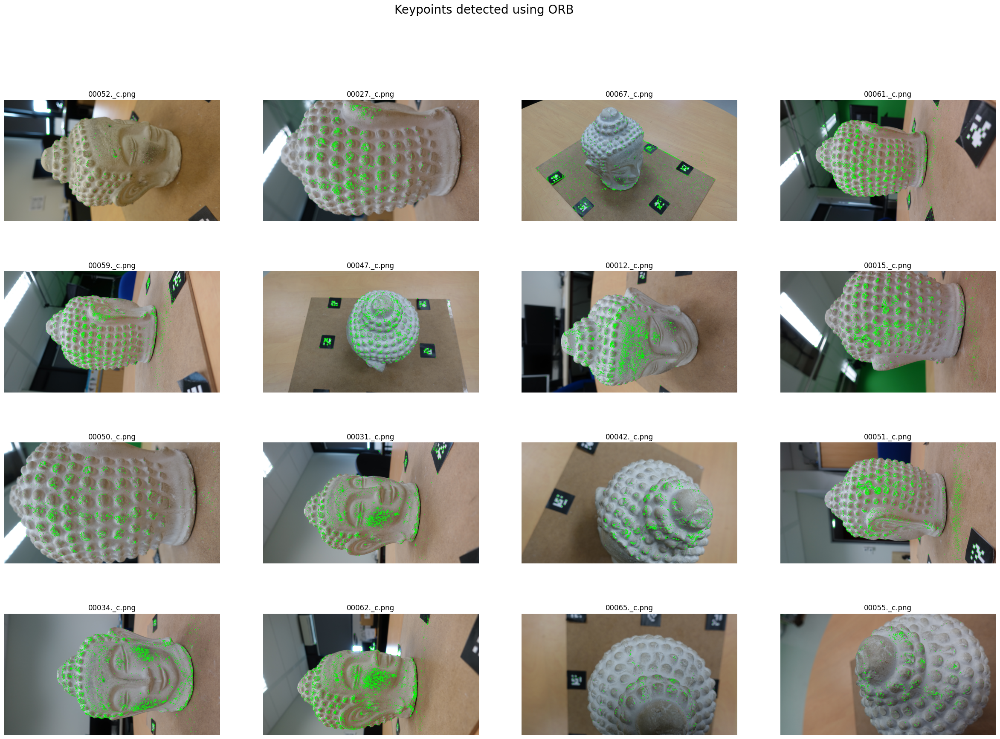

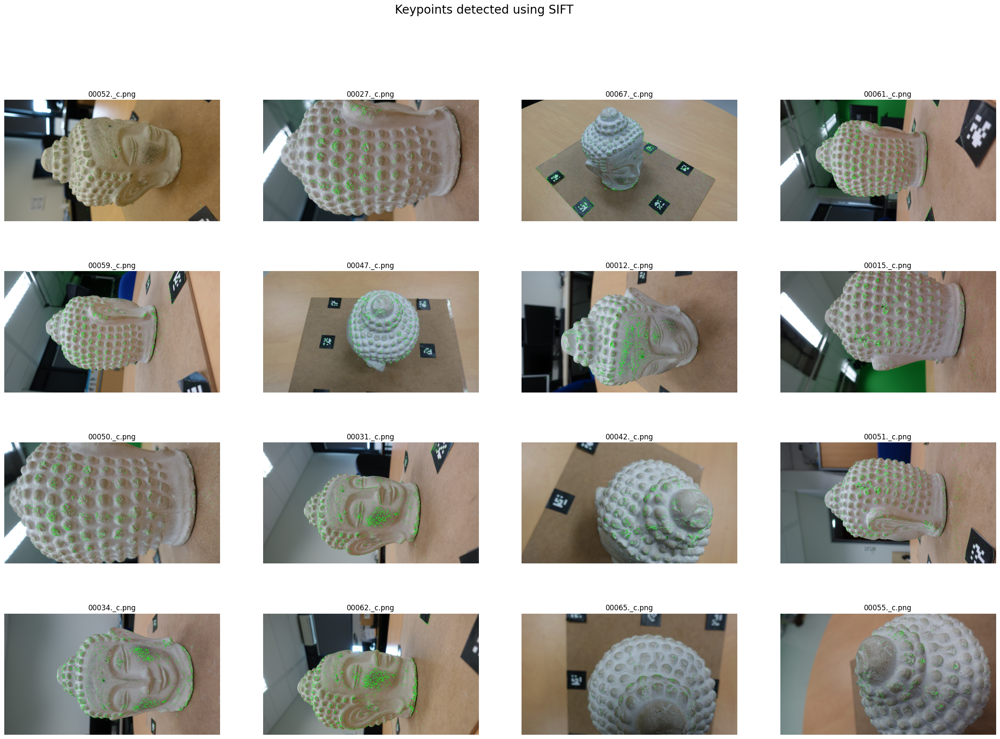

In [25]:
for method in annotated_images.keys():
    fig, ax = plt.subplots(4, 4)
    imgs_to_show, paths_shown = df.sample(16, random_state=42)[[f'{method}_annotated', 'filename']].to_numpy().T
    imag_names = [os.path.basename(p) for p in paths_shown]

    for i in range(4):
        for j in range(4):
            img = imgs_to_show[i * 4 + j]
            ax[i, j].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax[i, j].set_title(imag_names[i * 4 + j])
            ax[i, j].axis('off')
    plt.suptitle(f"Keypoints detected using {method.upper()}", fontsize=20)
    plt.show()